In [1]:
import sklearn
from sklearn.model_selection import train_test_split
import numpy as np
import shap
import pandas as pd
import numpy as np
from nltk.corpus import wordnet as wn
from sklearn import model_selection, naive_bayes, svm, linear_model
from sklearn.metrics import accuracy_score
from helper import read_imdb_split,download_data
from tf_idf import build_tf_idf
from sklearn.pipeline import Pipeline
np.random.seed(1337)
shap.initjs()

/Users/johanneswidera/Uni/bachelorarbeit/Code/hugging-face/HUGGING_ENV/lib/python3.9/site-packages/shap/utils/_clustering.py:35: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def _pt_shuffle_rec(i, indexes, index_mask, partition_tree, M, pos):
/Users/johanneswidera/Uni/bachelorarbeit/Code/hugging-face/HUGGING_ENV/lib/python3.9/site-packages/shap/utils/_clustering.py:54: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-

In [2]:
import os
import numpy as np

if not os.path.exists("/Sentiment"):
    os.chdir("..")

# 1. Get Training Data 

In [3]:
download_data()
texts, labels = read_imdb_split('../data/aclImdb/train')

In [4]:
from sklearn.feature_extraction.text import TfidfVectorizer
from bs4 import BeautifulSoup
import nltk
from nltk.stem import WordNetLemmatizer
import contractions
import re

import string
def preprocessor(text):
  soup = BeautifulSoup(text, 'html.parser')
  text = soup.get_text()
  text = text.lower()
  text = contractions.fix(text)
  text = text.translate(str.maketrans(string.punctuation, " " * len(string.punctuation)))
  text = re.sub(' +', ' ', text)
  return text 

In [5]:
df = pd.DataFrame({'text': texts})
df['preprocessed_text'] = df['text'].apply(lambda x: preprocessor(x))

The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.


In [6]:
corpus_train, corpus_test, y_train, y_test = train_test_split(df['preprocessed_text'].tolist(),labels,test_size=0.2)

# 2. Build Vectorizer

In [7]:
vectorizer_tf_idf = build_tf_idf()
vectorizer_tf_idf.fit(corpus_train)

TfidfVectorizer(max_df=0.99, min_df=0.001)

# 3. Build Models

# 3.1 Build Logistic Regression Model

In [8]:
from PipelineWrapper import PipelineWrapper
model = linear_model.LogisticRegression(penalty="l2")
model_logregression_new = PipelineWrapper(model, vectorizer_tf_idf, corpus_test, corpus_train, y_test, y_train)

In [9]:
model_logregression_new.fit()

In [10]:
model_logregression_new.report()

,0,1,accuracy,macro avg,weighted avg
precision,0.901912,0.884734,0.893,0.893323,0.893216
recall,0.878898,0.906756,0.893,0.892827,0.893000
f1-score,0.890256,0.895610,0.893,0.892933,0.892966
support,2469.000000,2531.000000,0.893,5000.000000,5000.000000


# 3.2 Build Decision Tree Classifier

In [11]:
from sklearn.tree import DecisionTreeClassifier


model_dtc = PipelineWrapper(DecisionTreeClassifier(), vectorizer_tf_idf, corpus_test, corpus_train, y_test, y_train)

In [12]:
model_dtc.fit()

In [13]:
model_dtc.report()

,0,1,accuracy,macro avg,weighted avg
precision,0.699281,0.712340,0.7058,0.705810,0.705891
recall,0.709194,0.702489,0.7058,0.705842,0.705800
f1-score,0.704203,0.707380,0.7058,0.705791,0.705811
support,2469.000000,2531.000000,0.7058,5000.000000,5000.000000


# 4 Analyze With SHAP

We know that the Logistic Regression Performs better than the Decision Tree Classifier.
To further investigate why thats the case we need to look into the models.

In the following i will do 3 things.

Per Model:
1. Most Positive/Negative Words
2. Investigate the Most Wrong Positive and Negative prediction

Model Comparision:
1. Investigate biggest Prediction gap accross the models

In [14]:
def make_predictions(X_batch_text):
    X_batch = vectorizer_tf_idf.transform(X_batch_text)
    preds = model_logregression_new.predict_proba(X_batch)
    return preds


In [15]:
masker = shap.maskers.Text(tokenizer=r"\W+") # this will create a basic whitespace tokenizer
# explainer_logreg = shap.Explainer(model_logregression_new.predict_proba , masker)
explainer_logreg = shap.Explainer(model_logregression_new.predict_proba, masker)


In [16]:
shap_values_logreg = explainer_logreg(corpus_test)

Partition explainer: 5001it [21:25,  3.85it/s]                            


In [17]:
print(shap_values_logreg)

.values =
array([array([[ 0.00206979, -0.00206979],
              [ 0.00206979, -0.00206979],
              [-0.00146726,  0.00146726],
              [-0.00146726,  0.00146726],
              [-0.13478484,  0.13478484],
              [-0.01910764,  0.01910764],
              [-0.00506571,  0.00506571],
              [-0.00506571,  0.00506571],
              [ 0.00225976, -0.00225976],
              [ 0.00225976, -0.00225976],
              [ 0.00225976, -0.00225976],
              [ 0.00225976, -0.00225976],
              [ 0.0027897 , -0.0027897 ],
              [ 0.0027897 , -0.0027897 ],
              [ 0.0027897 , -0.0027897 ],
              [ 0.0027897 , -0.0027897 ],
              [ 0.0027897 , -0.0027897 ],
              [-0.02700334,  0.02700334],
              [ 0.03247677, -0.03247677],
              [ 0.0353278 , -0.0353278 ],
              [ 0.05047088, -0.05047088],
              [ 0.03304425, -0.03304425],
              [ 0.00042531, -0.00042531],
              [ 0.000425

### 4.1 Investigate the biggest misclassification


In [18]:
y_prob_test = model_logregression_new.predict_proba(corpus_test) # with probabilites
y_predict_test = model_logregression_new.predict(corpus_test) # with labels 1 and 2

In [19]:
y_prob_test_np = np.array(y_prob_test)
y_predict_test_np = np.array(y_predict_test)
y_test_np = np.array(y_test)

In [20]:
wrong_positive_indexes = np.where((y_test_np == 1) & (y_predict_test_np != y_test_np))[0]
print("Wrong Positive Indexes: ",wrong_positive_indexes.size)

wrong_negative_indexes = np.where((y_test_np == 0) & (y_predict_test_np != y_test_np))[0]
print("Wrong Negative Indexes: ",wrong_negative_indexes.size)

most_wrong_positive_index = wrong_positive_indexes[np.argmax(y_prob_test_np[wrong_positive_indexes,1])]
most_wrong_negative_index = wrong_negative_indexes[np.argmax(y_prob_test_np[wrong_negative_indexes,0])]

Wrong Positive Indexes:  236
Wrong Negative Indexes:  299


#### 4.1.2 Most Wrong Positive Classification

Most wrong review 

In [21]:
print(corpus_test[most_wrong_positive_index])
print("Real Label: ", y_test[most_wrong_positive_index])
print("Predicted Label: ", y_predict_test[most_wrong_positive_index])
print("Predicted Probability Label: ", y_prob_test[most_wrong_positive_index])

it might not be the best movie of 2006 but it was a just a movie to excite and to think about the sentinel is a good political thriller movie which seems similar to or even borrows some elements from other political thriller movies such as in the line of fire and the manchurian candidate the basic plot of this movie is similar to other movies like this a plot to kill the president of the united states michael douglas stars as secret service agent pete garrison who spearheads the operation only to find out later that he has been framed kiefer sutherland co stars as a sort of rival by the name of david breckinridge and eva longoria as jill marin who is a rookie agent going under the guidance of agent breckinridge and academy award winner kim basinger as first lady sarah ballentine one improvement for this movie could have been more action as it is by some sources considered just as much an action film as is a thriller film but a good thing about this movie is instead of just an assassina

so its 0.5 behind the real label.
But Why lets investigate

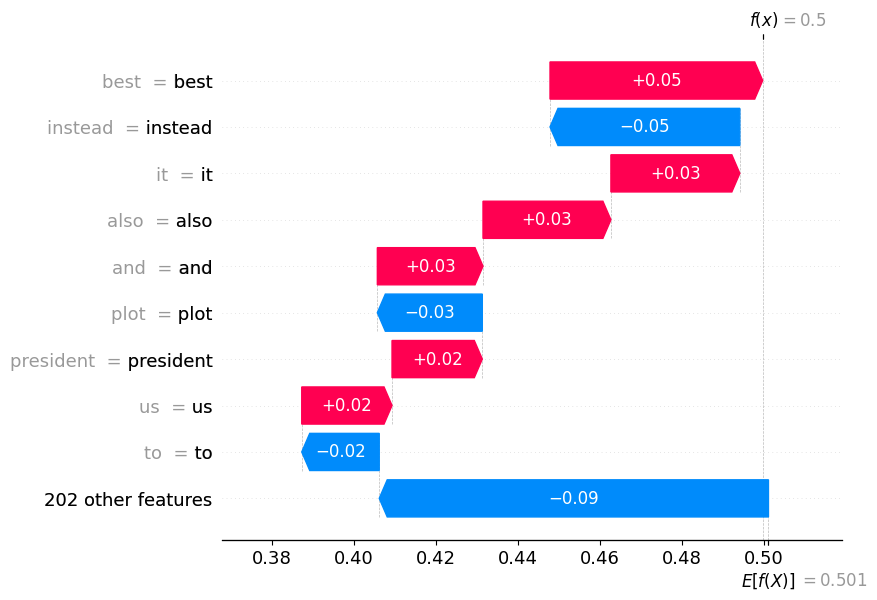

In [22]:
shap.plots.text(shap_values_logreg[most_wrong_positive_index])
shap.plots.waterfall(shap_values_logreg[most_wrong_positive_index, :, 1])

# interpretation:

Mit tf idf sind wir nicht in der lage den sinn in diesem text festzustellen

#### 4.1.2 Most Wrong Negative Classification

Most wrong review 

In [23]:
print(corpus_test[most_wrong_negative_index])
print("Real Label: ", y_test[most_wrong_negative_index])
print("Predicted Label: ", y_predict_test[most_wrong_negative_index])
print("Predicted Probability Label: ", y_prob_test[most_wrong_negative_index])

this is peter falk s film period i was 10 years old when this film came out i was already a film maven at the time of course neither my parents nor i saw this film when it came out but i was in love with the typeface of its ads the aura that this was an important film okay 34 years later i have finally seen the film having never seen any cassavetes directed film previously he is a hack overall zero sense of timing editing gena s performance reminds me too much of dustin hoffman s stint in rain man technically on par but entirely one note as tom cruise stole rain man falk takes the cake for this film i was annoyed with gena s performance really throughout it seemed better suited for awakenings blecch it is not all her fault she is a basket case from first scene to last we never find out why but falk s character seems real is performed wonderfully by falk as a seriously flawed man shave off at least an hour an editor needed and this would have been an arresting portrait not of a woman un

266


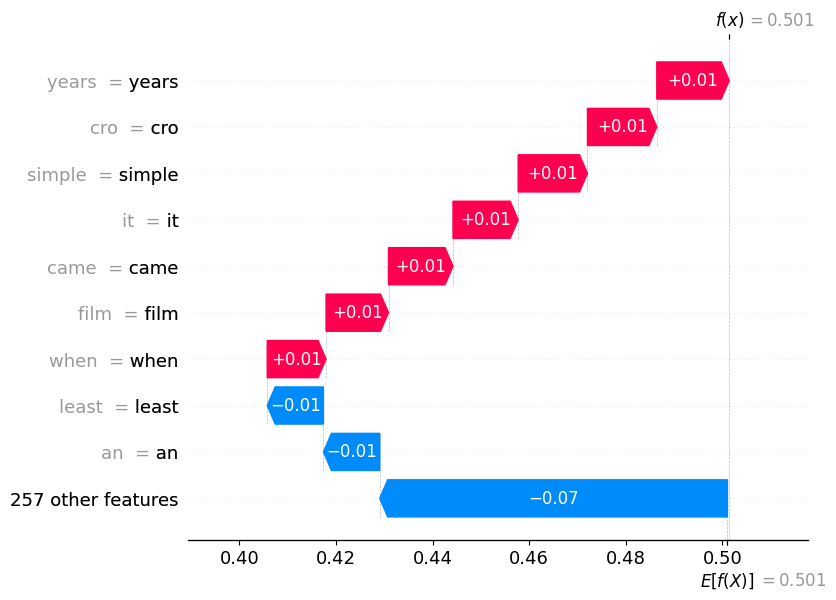

In [24]:
shap.plots.text(shap_values_logreg[most_wrong_negative_index])
print(len(shap_values_logreg[most_wrong_negative_index]))
shap.plots.waterfall(shap_values_logreg[most_wrong_negative_index, :, 1])

# Interpretation:

The 10 was learned as something positive but the whole sentence is 2/10
so it should be positive.
This can give us a hint for better Tokenization.


# 4.1.3 Highlight Signal Words

To better Visualize the most important words in a classification we can highlight the only the top 5 Words with the highest impact on the result and top 5 Words with the lowest impact on the result
As you can see in the last example the text was to long to see anything.
So i do it again and only highlight the top 10 words.



In [43]:
from signal_words import highlight_signal_words

highlight_signal_words(shap_values_logreg[0, :, 1],round_shap_values=3,top_words=4)

print("IN COMPARISION THIS WOULD BE THE OUTPUT FROM SHAP")
shap.plots.text(shap_values_logreg[0, :, 1])


IN COMPARISION THIS WOULD BE THE OUTPUT FROM SHAP


# 4.2 Global Interpretation Most Positive and negative Words

To understand how the model works

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


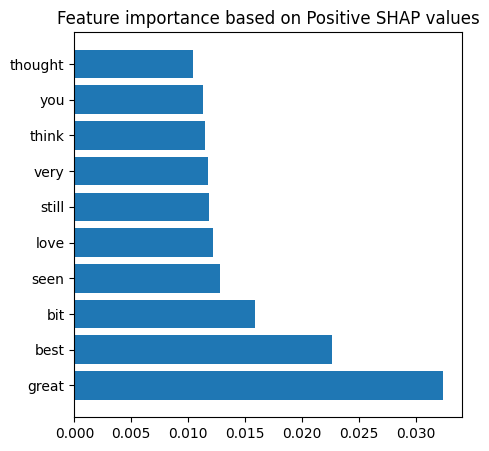

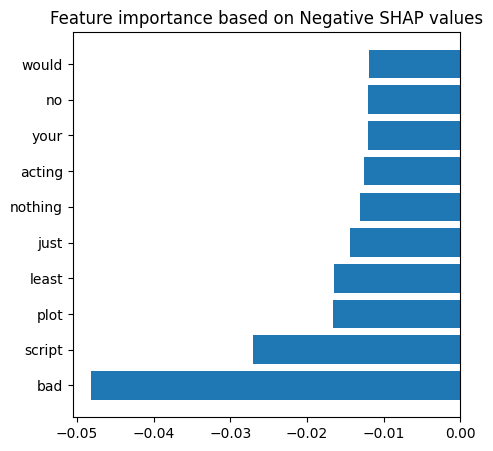

In [44]:
from custom_global import custom_global_explanation

custom_global_explanation(shap_values_logreg[:,:,1])

# 5. Analyze with SHAP: DTC

In [32]:
masker = shap.maskers.Text(tokenizer=r"\W+") # this will create a basic whitespace tokenizer
# explainer_logreg = shap.Explainer(model_logregression_new.predict_proba , masker)
explainer_dtc = shap.Explainer(model_dtc.predict_proba, masker)

In [33]:
shap_values_dtc = explainer_logreg(corpus_test[:100])

Partition explainer: 101it [00:16,  2.18it/s]                         


# 5.1 Local Effects

In [34]:
shap.plots.text(explainer_dtc[0, :, 1])

In [35]:
shap.plots.text(explainer_dtc[3, :, 1])

# 5.1.3 Custom Function to Highlight Signal Words 

In [59]:
highlight_signal_words(explainer_dtc[3, :, 1],round_shap_values=2,top_words=1)



#### interpretation:

you can directly see the Shap values Words with a Positive impact in the 1 percentile are very low and many words. you can directly see that the negative words only 4 lead the sentiment so mess even worse and crap this is great

# 5.2 Global Effects

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


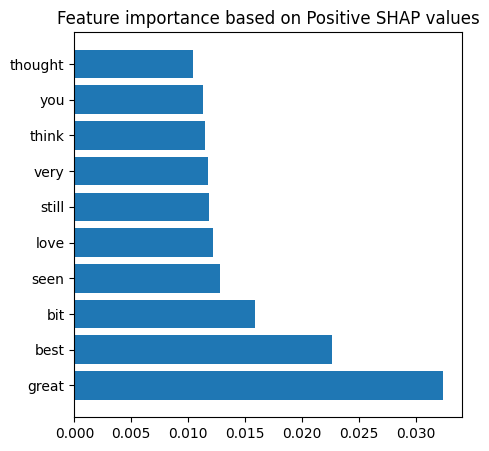

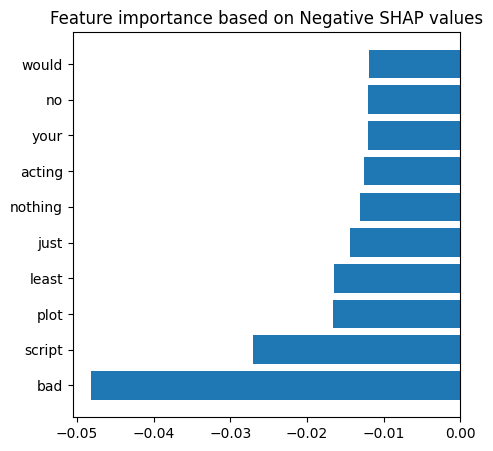

In [60]:
custom_global_explanation(explainer_dtc[:,:,1])

# 6 Investigate what happens when model and Masker are applied

In [61]:
masker = shap.maskers.Text(tokenizer=r"\W+") # this will create a basic whitespace tokenizer
# explainer_logreg = shap.Explainer(model_logregression_new.predict_proba , masker)


explainer_logreg = shap.Explainer(model_logregression_new.predict_proba, masker)

In [67]:
explainer_logreg(corpus_test[:1])

Partition explainer: 2it [10:53, 653.81s/it]              


.values =
array([[[ 0.00206979, -0.00206979],
        [ 0.00206979, -0.00206979],
        [-0.00146726,  0.00146726],
        [-0.00146726,  0.00146726],
        [-0.13478484,  0.13478484],
        [-0.01910764,  0.01910764],
        [-0.00506571,  0.00506571],
        [-0.00506571,  0.00506571],
        [ 0.00225976, -0.00225976],
        [ 0.00225976, -0.00225976],
        [ 0.00225976, -0.00225976],
        [ 0.00225976, -0.00225976],
        [ 0.0027897 , -0.0027897 ],
        [ 0.0027897 , -0.0027897 ],
        [ 0.0027897 , -0.0027897 ],
        [ 0.0027897 , -0.0027897 ],
        [ 0.0027897 , -0.0027897 ],
        [-0.02700334,  0.02700334],
        [ 0.03247677, -0.03247677],
        [ 0.0353278 , -0.0353278 ],
        [ 0.05047088, -0.05047088],
        [ 0.03304425, -0.03304425],
        [ 0.00042531, -0.00042531],
        [ 0.00042531, -0.00042531],
        [ 0.01420441, -0.01420441],
        [ 0.00809731, -0.00809731],
        [-0.01543097,  0.01543097],
        [-0.015430

To explain how the text "I like big pizzas" is processed by the SHAP explainer, let's assume we have already initialized the TfidfVectorizer, make_predictions function, and the shap.maskers.Text tokenizer as mentioned before.

1. First, the text "I like big pizzas" is passed as input to the SHAP explainer: shap_values = explainer(["I like big pizzas"]).
  
2. The shap.maskers.Text tokenizer, which uses the regular expression pattern r"\W+", tokenizes the input text. In this case, the tokenizer splits the text into tokens based on non-word characters, resulting in the following tokens: ["I", "like", "big", "pizzas"] coderzcolumn.com coderzcolumn.com.
   
3. The tokenizer also creates a dictionary with two keys:
'input_ids': A list of tokens that are not words, such as punctuations or spaces between words. In this case, since there are no non-word tokens, the value of this key would be an empty list [].
'offset_mapping': A list of tuples representing the start and end indexes of the tokens. In this case, the value of this key would be [(0, 1), (2, 6), (7, 10), (11, 17)], indicating the start and end indexes of each token in the input text coderzcolumn.com coderzcolumn.com.

1. The masked versions of the input text are generated by replacing each token with a mask token. For example, the masked versions of the input text could be: ["[MASK] like big pizzas", "I [MASK] big pizzas", "I like [MASK] pizzas", "I like big [MASK]"] coderzcolumn.com shap.readthedocs.io.
   
2. The make_predictions function is then called with each masked version of the input text to obtain the model's predictions for each masked instance.
   
3. The SHAP values are computed based on the differences in the model's predictions between the original text and the masked versions. These SHAP values quantify the contribution of each token to the model's output.


### Nochmal erklärt
So the Tokenizer only defines the granualarity in which we remove players / text.

most of the cases it makes sense to define a player as a word.
so its "[MASK] like big pizzas" and so on passed to the predict function in this case to the pipeline and the text is then vectorized by our defined TF IDF vectorizer

if we want to see the impact on a greater scale we can define a player as a sentence (split by "."). so if the initial sentence is "I like pizzas. But i hate Movies"
then the input to the tokenizer is "[MASK] But i hate Movies" and "I like pizzas [MASK]".

With this we have the flexibility to define what an player is and how big the impact of a player is on the result.

### But what is the Explainer

one missasumption would be to think that The Resulting Shap values are about the applied vectorizer. So the preprocessing steps (in TF-IDF) are applied like lemmatization etc. 
The resulting Explanation is at the granularity of the defined Player. So its the Raw text that was initially passed to the Explainer. Without the preprocessing of the Vectorizer. With a sligtly different example:

``Assume we use a Pipeline``

# Step 1.
``Read the Table from left to right``

|   Raw text   |    Masked Text    |    Preprocessed (lemmatized, lowercase)    |   Vector output   | Model Prediction
|--------------|-------------------|--------------------------------------------|-------------------|-------------------
|      I       |        I          |                  i                         |        [..        |x
|    liked     |      liked        |                 like                        |        ..        |   [*0.1,0.9*]
|     big      |     [masked]      |                 ''                          |        ..        |x
|    pizza     |      pizza        |                 pizza                       |        ]         |x


This is done for every Coalition in the raw text defined by the text Masker.

# Step 2.

Map the Shap Values / Owen Values to the Raw input text to See What impact each input feature has on the final result

|   Raw text   |   Shap/Owen Value |
|--------------|-------------------| 
|      I       |        0.1          | 
|    liked     |       0.4            | 
|     big      |        0.2           |  
|    pizza     |       0.2       |




# Fazit
This is why the Output Text is not Lemmatized or to lowercase etc.

But it is important to remove unnacassary noise like html tags.

The features of the shap_explanation are all words in the text. Split by defined Explainer.



